# NGC4419: Compare v3_v0.6 vs v3tk_v7.6.8

This notebook compares two ngist runs of NGC4419:

- `v3_v0.6` (4800-7000, older ngist)
- `v3tk_v7.6.8` (4800-9100, current ngist)

Focus:

1. Spatial binning
2. Stellar kinematics
3. SFH-derived maps (age, metallicity, and E(B-V) where available)

The workflow first inspects FITS structures, then auto-extracts matching maps and visualizes old/new/difference.

In [1]:
from pathlib import Path
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from astropy.io import fits

plt.style.use('seaborn-v0_8-whitegrid')

root = Path('.')
old_dir = root / 'v3_v7.2.1/NGC4419'
new_dir = root / 'v3tk_v7.6.8/NGC4419'

files = {
    'old': {
        'spatial': old_dir / 'NGC4419_SPATIAL_BINNING_maps.fits',
        'kin': old_dir / 'NGC4419_KIN_maps.fits',
        'sfh': old_dir / 'NGC4419_SFH_maps.fits',
        'gas': old_dir / 'NGC4419_gas_BIN_maps.fits',
    },
    'new': {
        'spatial': new_dir / 'NGC4419_spatial_binning_maps.fits',
        'kin': new_dir / 'NGC4419_kin_maps.fits',
        'sfh': new_dir / 'NGC4419_sfh_maps.fits',
        'gas': new_dir / 'NGC4419_gas_bin_maps.fits',
    }
}

for tag in ('old', 'new'):
    for kind, p in files[tag].items():
        if not p.exists():
            raise FileNotFoundError(f'Missing {tag}/{kind}: {p}')

print('All target files found.')
for tag in ('old', 'new'):
    print(f'\n{tag.upper()}')
    for kind, p in files[tag].items():
        print(f'  {kind:7s}: {p}')

All target files found.

OLD
  spatial: v3_v7.2.1/NGC4419/NGC4419_SPATIAL_BINNING_maps.fits
  kin    : v3_v7.2.1/NGC4419/NGC4419_KIN_maps.fits
  sfh    : v3_v7.2.1/NGC4419/NGC4419_SFH_maps.fits
  gas    : v3_v7.2.1/NGC4419/NGC4419_gas_BIN_maps.fits

NEW
  spatial: v3tk_v7.6.8/NGC4419/NGC4419_spatial_binning_maps.fits
  kin    : v3tk_v7.6.8/NGC4419/NGC4419_kin_maps.fits
  sfh    : v3tk_v7.6.8/NGC4419/NGC4419_sfh_maps.fits
  gas    : v3tk_v7.6.8/NGC4419/NGC4419_gas_bin_maps.fits


In [2]:
def hdu_shape_from_header(hdu):
    naxis = int(hdu.header.get('NAXIS', 0) or 0)
    if naxis == 0:
        return None
    return tuple(hdu.header.get(f'NAXIS{i}', '?') for i in range(naxis, 0, -1))


def summarize_hdus(path):
    rows = []
    with fits.open(path, memmap=False, ignore_missing_end=True) as hdul:
        for i, hdu in enumerate(hdul):
            shape = hdu_shape_from_header(hdu)
            dtype = None
            data_error = None
            try:
                data = hdu.data
                if data is not None:
                    shape = tuple(data.shape)
                    dtype = str(data.dtype)
            except Exception as exc:
                data_error = f'{type(exc).__name__}: {exc}'
                bitpix = hdu.header.get('BITPIX')
                dtype = f'BITPIX={bitpix}' if bitpix is not None else 'unreadable'

            rows.append(
                {
                    'idx': i,
                    'extname': hdu.name,
                    'type': type(hdu).__name__,
                    'shape': shape,
                    'dtype': dtype,
                    'data_error': data_error,
                }
            )
    return pd.DataFrame(rows)


for run in ('old', 'new'):
    for kind in ('spatial', 'kin', 'sfh', 'gas'):
        p = files[run][kind]
        print(f'\n===== {run.upper()} :: {kind.upper()} :: {p.name} =====')
        display(summarize_hdus(p))



===== OLD :: SPATIAL :: NGC4419_SPATIAL_BINNING_maps.fits =====


,idx,extname,type,shape,dtype,data_error
0,0,PRIMARY,PrimaryHDU,None,None,None
1,1,BINID,ImageHDU,"(643, 628)",>f8,None
2,2,FLUX,ImageHDU,"(643, 628)",>f8,None
3,3,SNR,ImageHDU,"(643, 628)",>f8,None
4,4,SNRBIN,ImageHDU,"(643, 628)",>f8,None
5,5,XBIN,ImageHDU,"(643, 628)",>f8,None
6,6,YBIN,ImageHDU,"(643, 628)",>f8,None



===== OLD :: KIN :: NGC4419_KIN_maps.fits =====


,idx,extname,type,shape,dtype,data_error
0,0,PRIMARY,PrimaryHDU,None,None,None
1,1,V,ImageHDU,"(643, 628)",>f8,None
2,2,SIGMA,ImageHDU,"(643, 628)",>f8,None
3,3,H3,ImageHDU,"(643, 628)",>f8,None
4,4,H4,ImageHDU,"(643, 628)",>f8,None
5,5,FORM_ERR_V,ImageHDU,"(643, 628)",>f8,None
6,6,FORM_ERR_SIGMA,ImageHDU,"(643, 628)",>f8,None
7,7,FORM_ERR_H3,ImageHDU,"(643, 628)",>f8,None
8,8,FORM_ERR_H4,ImageHDU,"(643, 628)",>f8,None
9,9,SNR_POSTFIT,ImageHDU,"(643, 628)",>f8,None



===== OLD :: SFH :: NGC4419_SFH_maps.fits =====


,idx,extname,type,shape,dtype,data_error
0,0,PRIMARY,PrimaryHDU,None,None,None
1,1,AGE,ImageHDU,"(643, 628)",>f8,None
2,2,METAL,ImageHDU,"(643, 628)",>f8,None
3,3,ALPHA,ImageHDU,"(643, 628)",>f8,None
4,4,SNR_POSTFIT,ImageHDU,"(643, 628)",>f8,None
5,5,EBV,ImageHDU,"(643, 628)",>f8,None



===== OLD :: GAS :: NGC4419_gas_BIN_maps.fits =====


,idx,extname,type,shape,dtype,data_error
0,0,PRIMARY,PrimaryHDU,None,None,None
1,1,BIN_ID,ImageHDU,"(643, 628)",>f8,None
2,2,V_STARS2,ImageHDU,"(643, 628)",>f8,None
3,3,SIGMA_STARS2,ImageHDU,"(643, 628)",>f8,None
4,4,CHI2_TOT,ImageHDU,"(643, 628)",>f8,None
...,...,...,...,...,...,...
100,100,SII6730_SIGMA,ImageHDU,"(643, 628)",>f8,None
101,101,SII6730_SIGMA_ERR,ImageHDU,"(643, 628)",>f8,None
102,102,SII6730_SIGMA_CORR,ImageHDU,"(643, 628)",>f8,None
103,103,NII_HA_BPT,ImageHDU,"(643, 628)",>f8,None



===== NEW :: SPATIAL :: NGC4419_spatial_binning_maps.fits =====


,idx,extname,type,shape,dtype,data_error
0,0,PRIMARY,PrimaryHDU,None,None,None
1,1,BINID,ImageHDU,"(643, 629)",>f8,None
2,2,FLUX,ImageHDU,"(643, 629)",>f8,None
3,3,SNR,ImageHDU,"(643, 629)",>f8,None
4,4,SNRBIN,ImageHDU,"(643, 629)",>f8,None
5,5,XBIN,ImageHDU,"(643, 629)",>f8,None
6,6,YBIN,ImageHDU,"(643, 629)",>f8,None



===== NEW :: KIN :: NGC4419_kin_maps.fits =====


,idx,extname,type,shape,dtype,data_error
0,0,PRIMARY,PrimaryHDU,None,None,None
1,1,V,ImageHDU,"(643, 629)",>f8,None
2,2,SIGMA,ImageHDU,"(643, 629)",>f8,None
3,3,H3,ImageHDU,"(643, 629)",>f8,None
4,4,H4,ImageHDU,"(643, 629)",>f8,None
5,5,FORM_ERR_V,ImageHDU,"(643, 629)",>f8,None
6,6,FORM_ERR_SIGMA,ImageHDU,"(643, 629)",>f8,None
7,7,FORM_ERR_H3,ImageHDU,"(643, 629)",>f8,None
8,8,FORM_ERR_H4,ImageHDU,"(643, 629)",>f8,None
9,9,SNR_POSTFIT,ImageHDU,"(643, 629)",>f8,None



===== NEW :: SFH :: NGC4419_sfh_maps.fits =====


,idx,extname,type,shape,dtype,data_error
0,0,PRIMARY,PrimaryHDU,None,None,None
1,1,AGE,ImageHDU,"(643, 629)",>f8,None
2,2,METAL,ImageHDU,"(643, 629)",>f8,None
3,3,ALPHA,ImageHDU,"(643, 629)",>f8,None
4,4,SNR_POSTFIT,ImageHDU,"(643, 629)",>f8,None
5,5,RED_CHI2,ImageHDU,"(643, 629)",>f8,None
6,6,EBV,ImageHDU,"(643, 629)",>f8,None



===== NEW :: GAS :: NGC4419_gas_bin_maps.fits =====


,idx,extname,type,shape,dtype,data_error
0,0,PRIMARY,PrimaryHDU,None,None,None
1,1,BIN_ID,ImageHDU,"(643, 629)",>f8,None
2,2,V_STARS2,ImageHDU,"(643, 629)",>f8,None
3,3,SIGMA_STARS2,ImageHDU,"(643, 629)",>f8,None
4,4,CHI2_TOT,ImageHDU,"(643, 629)",>f8,None
...,...,...,...,...,...,...
149,149,SIII9068_SIGMA,ImageHDU,"(643, 629)",>f8,None
150,150,SIII9068_SIGMA_ERR,ImageHDU,"(643, 629)",>f8,None
151,151,SIII9068_SIGMA_CORR,ImageHDU,"(643, 629)",>f8,None
152,152,NII_HA_BPT,ImageHDU,"(643, 629)",>f8,None


## Load Maps and Define Comparison Helpers

In [3]:
from matplotlib.colors import TwoSlopeNorm


def read_map(path, extname):
    with fits.open(path) as hdul:
        arr = np.array(hdul[extname].data, dtype=float)
    arr[~np.isfinite(arr)] = np.nan
    return arr


def align_map_pair(old_map, new_map, label=None):
    if old_map.shape == new_map.shape:
        return old_map, new_map
    if old_map.ndim != new_map.ndim:
        raise ValueError(
            f'{label or "map"}: cannot align maps with different dimensions: '
            f'old {old_map.shape}, new {new_map.shape}'
        )

    common_shape = tuple(min(o, n) for o, n in zip(old_map.shape, new_map.shape))
    old_slices = tuple(slice(0, n) for n in common_shape)
    new_slices = tuple(slice(0, n) for n in common_shape)
    if label is not None:
        print(
            f'Warning: {label} shape mismatch old {old_map.shape}, new {new_map.shape}; '
            f'using common crop {common_shape}.'
        )
    return old_map[old_slices], new_map[new_slices]


def read_map_pair(old_path, new_path, extname, label=None):
    old_map = read_map(old_path, extname)
    new_map = read_map(new_path, extname)
    return align_map_pair(old_map, new_map, label or extname)


def percent_change_map(old_map, new_map):
    old_map, new_map = align_map_pair(old_map, new_map)
    pct = np.full(old_map.shape, np.nan, dtype=float)
    mask = np.isfinite(old_map) & np.isfinite(new_map) & (old_map != 0)
    pct[mask] = 100.0 * (new_map[mask] - old_map[mask]) / np.abs(old_map[mask])
    return pct, mask


def compare_stats(old_map, new_map, label):
    old_map, new_map = align_map_pair(old_map, new_map, label)
    mask = np.isfinite(old_map) & np.isfinite(new_map)
    pct_map, pct_mask = percent_change_map(old_map, new_map)

    if mask.sum() == 0:
        return {
            'quantity': label,
            'n_valid': 0,
            'n_valid_nonzero_old': 0,
            'median_old': np.nan,
            'median_new': np.nan,
            'median_delta_new_minus_old': np.nan,
            'mean_delta_new_minus_old': np.nan,
            'std_delta': np.nan,
            'rms_delta': np.nan,
            'median_pct_change': np.nan,
            'mean_pct_change': np.nan,
            'std_pct_change': np.nan,
            'rms_pct_change': np.nan,
            'pearson_r': np.nan,
        }

    o = old_map[mask]
    n = new_map[mask]
    d = n - o
    if o.size > 1 and np.nanstd(o) > 0 and np.nanstd(n) > 0:
        r = float(np.corrcoef(o, n)[0, 1])
    else:
        r = np.nan

    pct_vals = pct_map[pct_mask]
    if pct_vals.size == 0:
        median_pct = np.nan
        mean_pct = np.nan
        std_pct = np.nan
        rms_pct = np.nan
    else:
        median_pct = float(np.nanmedian(pct_vals))
        mean_pct = float(np.nanmean(pct_vals))
        std_pct = float(np.nanstd(pct_vals))
        rms_pct = float(np.sqrt(np.nanmean(pct_vals**2)))

    return {
        'quantity': label,
        'n_valid': int(mask.sum()),
        'n_valid_nonzero_old': int(pct_mask.sum()),
        'median_old': float(np.nanmedian(o)),
        'median_new': float(np.nanmedian(n)),
        'median_delta_new_minus_old': float(np.nanmedian(d)),
        'mean_delta_new_minus_old': float(np.nanmean(d)),
        'std_delta': float(np.nanstd(d)),
        'rms_delta': float(np.sqrt(np.nanmean(d**2))),
        'median_pct_change': median_pct,
        'mean_pct_change': mean_pct,
        'std_pct_change': std_pct,
        'rms_pct_change': rms_pct,
        'pearson_r': r,
    }


def robust_limits(arr, p=(2, 98)):
    x = arr[np.isfinite(arr)]
    if x.size == 0:
        return (0.0, 1.0)
    lo, hi = np.nanpercentile(x, p)
    if not np.isfinite(lo) or not np.isfinite(hi) or lo == hi:
        lo, hi = np.nanmin(x), np.nanmax(x)
        if lo == hi:
            hi = lo + 1.0
    return float(lo), float(hi)


def robust_symmetric_limit(arr, percentile=98, fallback=1.0):
    x = np.abs(arr[np.isfinite(arr)])
    if x.size == 0:
        return float(fallback)
    lim = np.nanpercentile(x, percentile)
    if not np.isfinite(lim) or lim == 0:
        lim = np.nanmax(x)
    if not np.isfinite(lim) or lim == 0:
        lim = fallback
    return float(lim)


def plot_triplet(
    old_map,
    new_map,
    title,
    cmap_main='viridis',
    cmap_diff='RdBu_r',
    show_percent=True,
):
    old_map, new_map = align_map_pair(old_map, new_map, title)
    diff = new_map - old_map
    pct, _ = percent_change_map(old_map, new_map)

    vmin, vmax = robust_limits(np.r_[old_map.ravel(), new_map.ravel()])
    dlim = robust_symmetric_limit(diff, percentile=98, fallback=1.0)
    plim = robust_symmetric_limit(pct, percentile=98, fallback=10.0)

    ncols = 4 if show_percent else 3
    fig, axes = plt.subplots(
        1, ncols, figsize=(4.8 * ncols, 4.8), constrained_layout=True
    )

    im0 = axes[0].imshow(old_map, origin='lower', cmap=cmap_main, vmin=vmin, vmax=vmax)
    axes[0].set_title(f'OLD: {title}')
    fig.colorbar(im0, ax=axes[0], fraction=0.046, pad=0.04)

    im1 = axes[1].imshow(new_map, origin='lower', cmap=cmap_main, vmin=vmin, vmax=vmax)
    axes[1].set_title(f'NEW: {title}')
    fig.colorbar(im1, ax=axes[1], fraction=0.046, pad=0.04)

    norm_diff = TwoSlopeNorm(vmin=-dlim, vcenter=0.0, vmax=dlim)
    im2 = axes[2].imshow(diff, origin='lower', cmap=cmap_diff, norm=norm_diff)
    axes[2].set_title(f'DIFF (new-old): {title}')
    fig.colorbar(im2, ax=axes[2], fraction=0.046, pad=0.04)

    if show_percent:
        norm_pct = TwoSlopeNorm(vmin=-plim, vcenter=0.0, vmax=plim)
        im3 = axes[3].imshow(pct, origin='lower', cmap=cmap_diff, norm=norm_pct)
        axes[3].set_title(f'PCT DIFF ((new-old)/abs(old)*100): {title}')
        fig.colorbar(im3, ax=axes[3], fraction=0.046, pad=0.04)

    for ax in axes:
        ax.set_xticks([])
        ax.set_yticks([])

    plt.show()


def scatter_old_new(old_map, new_map, title):
    old_map, new_map = align_map_pair(old_map, new_map, title)
    mask = np.isfinite(old_map) & np.isfinite(new_map)
    o = old_map[mask]
    n = new_map[mask]

    if o.size == 0:
        print(f'No valid points for {title}')
        return

    fig, ax = plt.subplots(1, 1, figsize=(5.5, 5.2), constrained_layout=True)
    ax.scatter(o, n, s=2, alpha=0.35)

    lo = np.nanpercentile(np.r_[o, n], 1)
    hi = np.nanpercentile(np.r_[o, n], 99)
    ax.plot([lo, hi], [lo, hi], 'r--', lw=1)
    ax.set_xlim(lo, hi)
    ax.set_ylim(lo, hi)
    ax.set_xlabel('Old')
    ax.set_ylabel('New')
    ax.set_title(f'Old vs New: {title}')
    plt.show()


def get_extension_names(path):
    with fits.open(path, memmap=False, ignore_missing_end=True) as hdul:
        return {
            hdu.name.upper()
            for hdu in hdul
            if int(hdu.header.get('NAXIS', 0) or 0) > 0 and hdu.name not in ('PRIMARY', '')
        }


def get_common_gas_map_names(old_path, new_path, target_lines, suffixes=('FLUX',)):
    old_ext = get_extension_names(old_path)
    new_ext = get_extension_names(new_path)
    common_ext = old_ext & new_ext

    selected = []
    for name in common_ext:
        if '_' not in name:
            continue
        line_name, suffix = name.rsplit('_', 1)
        if line_name in target_lines and suffix in suffixes:
            selected.append(name)

    line_order = {line: i for i, line in enumerate(target_gas_lines)}
    suffix_order = {'FLUX': 0}

    def sort_key(name):
        line_name, suffix = name.rsplit('_', 1)
        return (line_order.get(line_name, 999), suffix_order.get(suffix, 99), line_name, suffix)

    return sorted(selected, key=sort_key)


requested_gas_lines = ['HB4861', 'OIII5006', 'NII6548', 'HA6562', 'SII6717', 'SII6730']
line_alias = {'SII6717': 'SII6716'}
target_gas_lines = [line_alias.get(line, line) for line in requested_gas_lines]
target_gas_line_set = set(target_gas_lines)

gas_map_names = get_common_gas_map_names(
    files['old']['gas'], files['new']['gas'], target_gas_line_set
)
if len(gas_map_names) == 0:
    raise ValueError('No requested gas map extensions ending with _FLUX found.')

available_selected_lines = {name.rsplit('_', 1)[0] for name in gas_map_names}
missing_requested_lines = [line for line in target_gas_lines if line not in available_selected_lines]
if len(missing_requested_lines) > 0:
    print(f'Warning: requested gas lines missing in old/new common set: {missing_requested_lines}')

oiii5006_matches = [name for name in gas_map_names if 'OIII5006' in name]
if len(oiii5006_matches) == 0:
    print('Warning: no OIII5006 gas maps found among selected extensions.')
else:
    print(f'OIII5006 maps included: {oiii5006_matches}')

print('Requested gas lines (SII6717 mapped to SII6716):', requested_gas_lines)
print('Selected gas maps:', gas_map_names)

maps = {
    'spatial': {
        'BINID': read_map_pair(files['old']['spatial'], files['new']['spatial'], 'BINID', 'SPATIAL_BINID'),
        'SNRBIN': read_map_pair(files['old']['spatial'], files['new']['spatial'], 'SNRBIN', 'SPATIAL_SNRBIN'),
        'FLUX': read_map_pair(files['old']['spatial'], files['new']['spatial'], 'FLUX', 'SPATIAL_FLUX'),
    },
    'kin': {
        'V': read_map_pair(files['old']['kin'], files['new']['kin'], 'V', 'KIN_V'),
        'SIGMA': read_map_pair(files['old']['kin'], files['new']['kin'], 'SIGMA', 'KIN_SIGMA'),
        'H3': read_map_pair(files['old']['kin'], files['new']['kin'], 'H3', 'KIN_H3'),
        'H4': read_map_pair(files['old']['kin'], files['new']['kin'], 'H4', 'KIN_H4'),
    },
    'sfh': {
        'AGE': read_map_pair(files['old']['sfh'], files['new']['sfh'], 'AGE', 'SFH_AGE'),
        'METAL': read_map_pair(files['old']['sfh'], files['new']['sfh'], 'METAL', 'SFH_METAL'),
        'EBV': read_map_pair(files['old']['sfh'], files['new']['sfh'], 'EBV', 'SFH_EBV'),
    },
    'gas': {
        name: read_map_pair(files['old']['gas'], files['new']['gas'], name, f'GAS_{name}')
        for name in gas_map_names
    },
}

print('Loaded map groups:')
for group, d in maps.items():
    print(f'  {group}: {list(d.keys())}')


OIII5006 maps included: ['OIII5006_FLUX']
Requested gas lines (SII6717 mapped to SII6716): ['HB4861', 'OIII5006', 'NII6548', 'HA6562', 'SII6717', 'SII6730']
Selected gas maps: ['HB4861_FLUX', 'OIII5006_FLUX', 'NII6548_FLUX', 'HA6562_FLUX', 'SII6716_FLUX', 'SII6730_FLUX']


Loaded map groups:
  spatial: ['BINID', 'SNRBIN', 'FLUX']
  kin: ['V', 'SIGMA', 'H3', 'H4']
  sfh: ['AGE', 'METAL', 'EBV']
  gas: ['HB4861_FLUX', 'OIII5006_FLUX', 'NII6548_FLUX', 'HA6562_FLUX', 'SII6716_FLUX', 'SII6730_FLUX']


## Spatial Binning Comparison

Valid spaxels with BINID in both runs: 154244
Fraction with identical BINID assignment: 0.0001
Unique bins old: 17290
Unique bins new: 17360


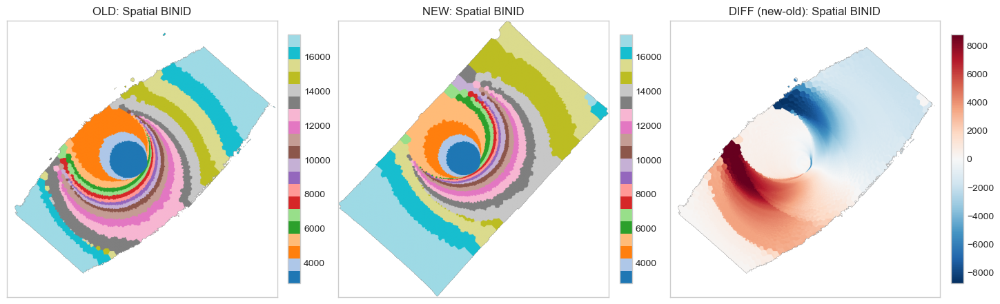

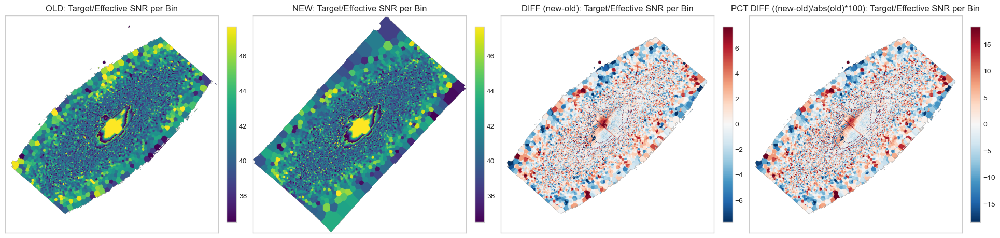

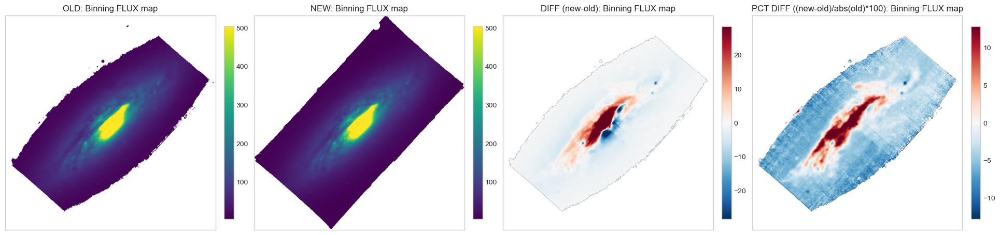

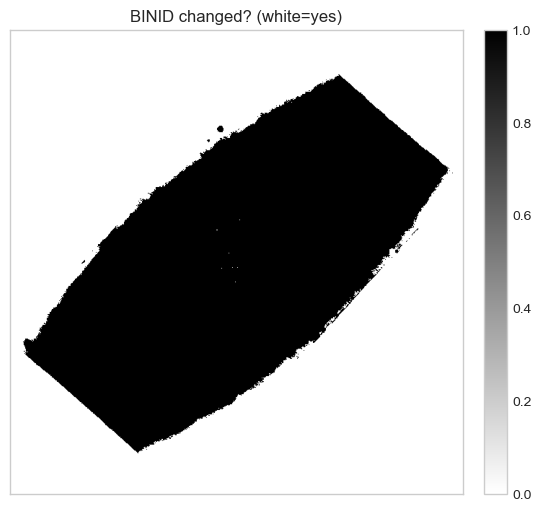

In [4]:
old_binid, new_binid = maps['spatial']['BINID']
valid_bin = np.isfinite(old_binid) & np.isfinite(new_binid)
same_bin = (old_binid == new_binid) & valid_bin

n_valid = valid_bin.sum()
frac_same = same_bin.sum() / n_valid if n_valid > 0 else np.nan

print(f'Valid spaxels with BINID in both runs: {n_valid}')
print(f'Fraction with identical BINID assignment: {frac_same:.4f}')
print(f'Unique bins old: {np.unique(old_binid[valid_bin]).size}')
print(f'Unique bins new: {np.unique(new_binid[valid_bin]).size}')

plot_triplet(old_binid, new_binid, 'Spatial BINID', cmap_main='tab20', cmap_diff='RdBu_r', show_percent=False)
plot_triplet(*maps['spatial']['SNRBIN'], 'Target/Effective SNR per Bin')
plot_triplet(*maps['spatial']['FLUX'], 'Binning FLUX map')

# Binary mask of where bin assignment changed
changed = np.where(valid_bin, (old_binid != new_binid).astype(float), np.nan)
fig, ax = plt.subplots(1, 1, figsize=(6, 5), constrained_layout=True)
im = ax.imshow(changed, origin='lower', cmap='gray_r', vmin=0, vmax=1)
ax.set_title('BINID changed? (white=yes)')
ax.set_xticks([])
ax.set_yticks([])
fig.colorbar(im, ax=ax, fraction=0.046, pad=0.04)
plt.show()

## Stellar Kinematics Comparison


### V


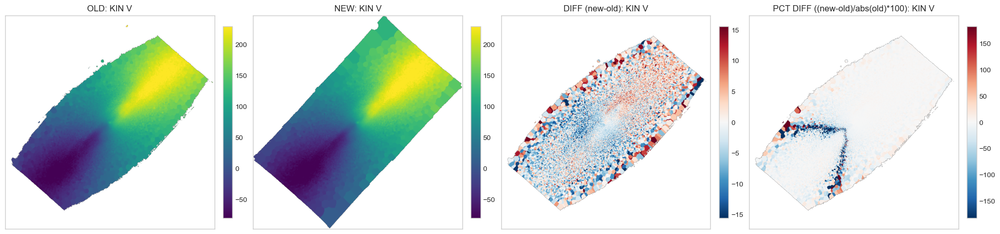

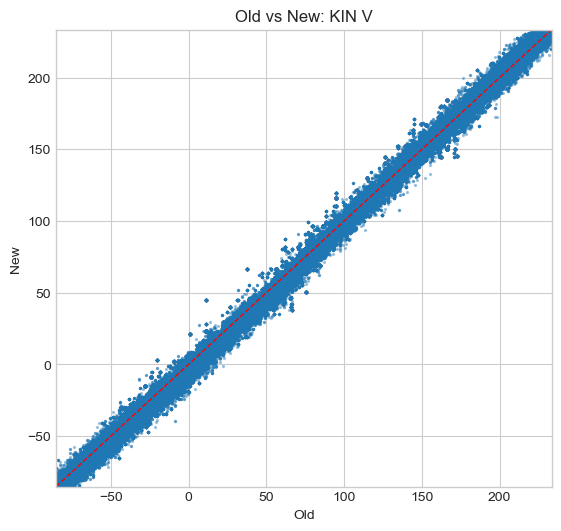


### SIGMA


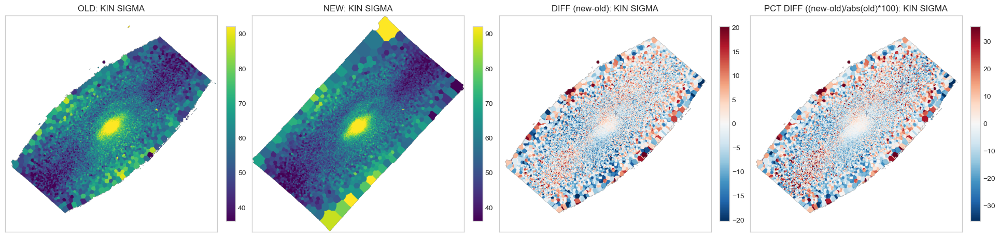

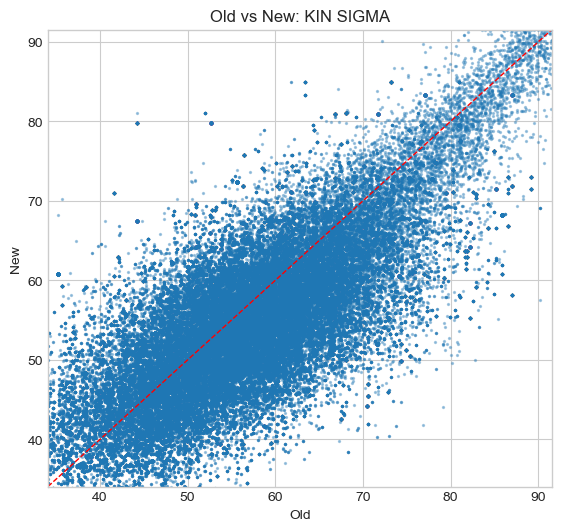


### H3


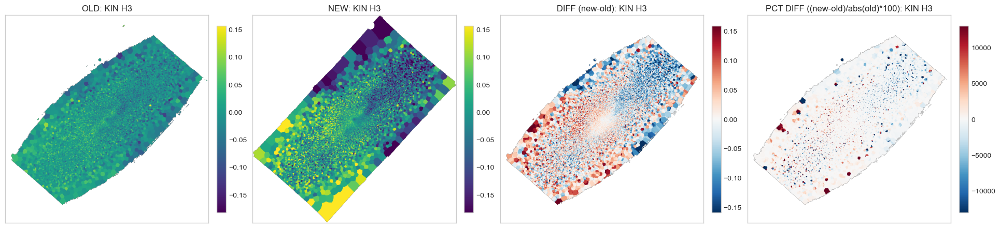

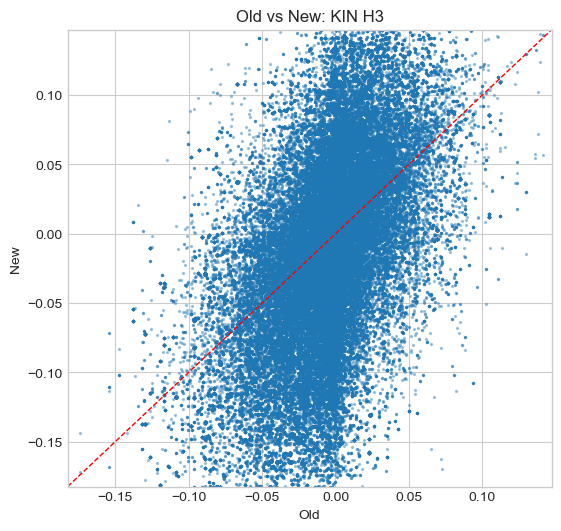


### H4


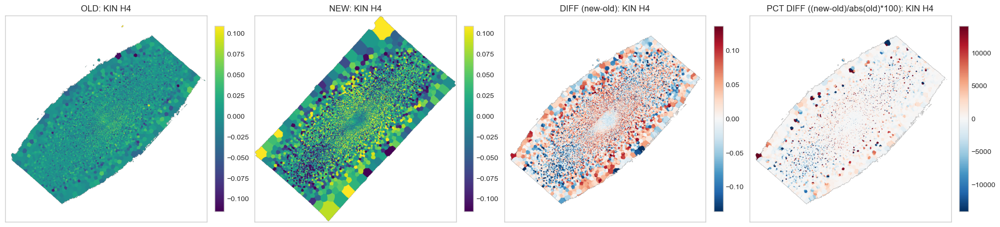

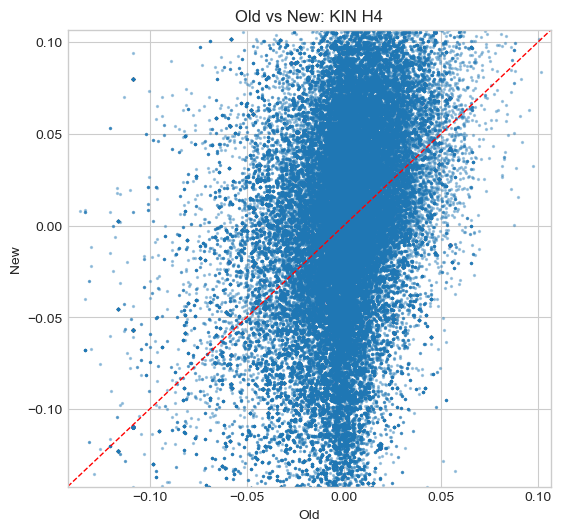

,quantity,n_valid,n_valid_nonzero_old,median_old,median_new,median_delta_new_minus_old,mean_delta_new_minus_old,std_delta,rms_delta,median_pct_change,mean_pct_change,std_pct_change,rms_pct_change,pearson_r
0,KIN_V,154244,154243,75.192382,72.768711,-1.086678,-0.961420,6.250357,6.323867,-1.118921,-24.550989,2033.479999,2033.628201,0.997993
1,KIN_SIGMA,154244,154244,56.980355,54.985583,-1.917980,-2.091276,8.002747,8.271481,-3.396997,-2.132491,28.494586,28.574270,0.751359
2,KIN_H3,154244,154243,-0.003689,-0.007966,-0.003029,-0.005367,0.066107,0.066325,-12.279875,-99.056707,48975.147670,48975.247846,0.548957
3,KIN_H4,154244,154243,0.000584,0.007379,0.007138,0.002639,0.055806,0.055868,52.934739,-203.738746,40210.471419,40210.987568,0.331688


In [5]:
kin_stats = []
for q, (old_m, new_m) in maps['kin'].items():
    print(f'\n### {q}')
    plot_triplet(old_m, new_m, f'KIN {q}')
    scatter_old_new(old_m, new_m, f'KIN {q}')
    kin_stats.append(compare_stats(old_m, new_m, f'KIN_{q}'))

kin_stats_df = pd.DataFrame(kin_stats)
display(kin_stats_df)

## SFH Comparison (Age, Metallicity, E(B-V))


### AGE


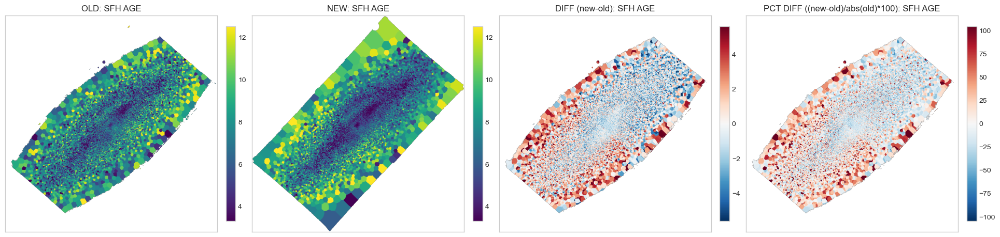

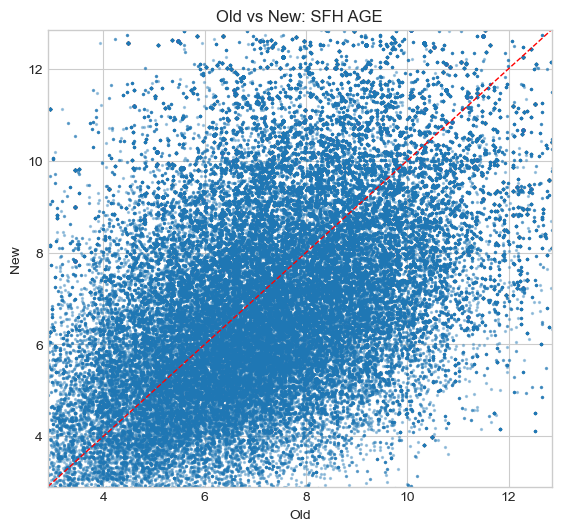


### METAL


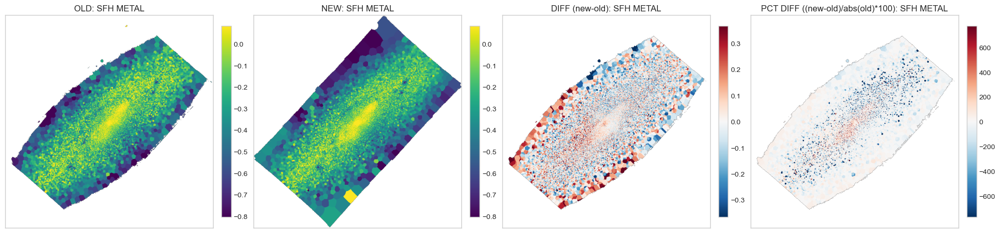

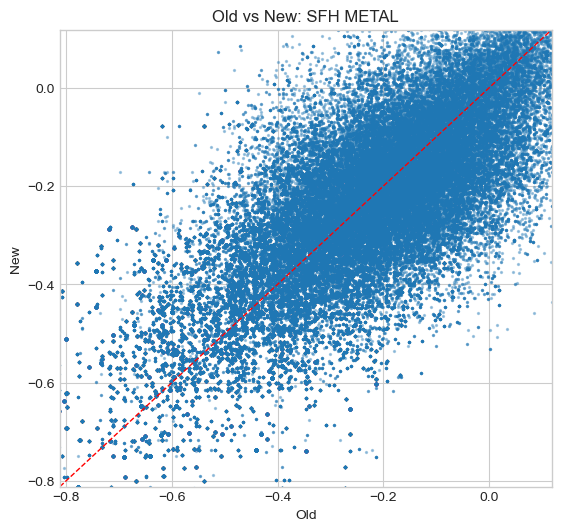


### EBV


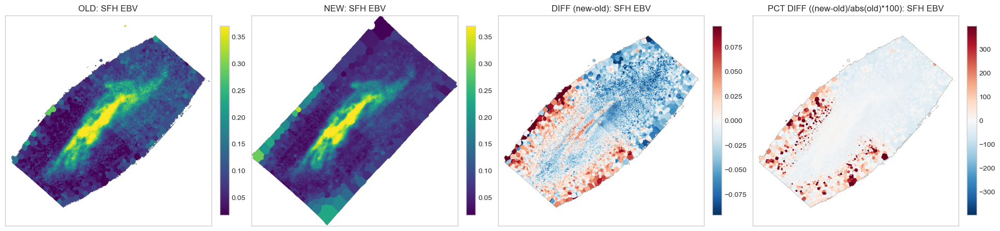

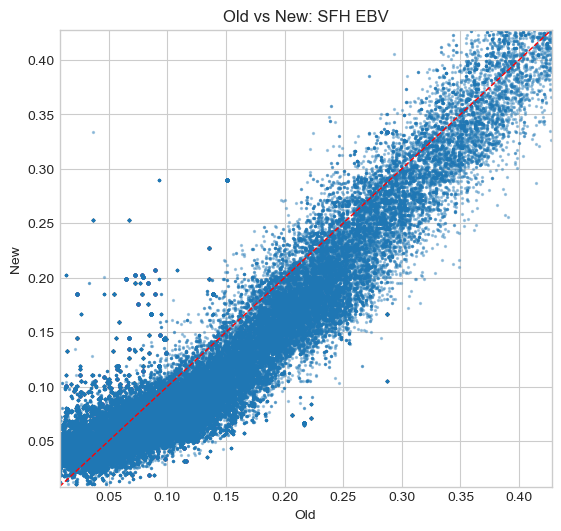

,quantity,n_valid,n_valid_nonzero_old,median_old,median_new,median_delta_new_minus_old,mean_delta_new_minus_old,std_delta,rms_delta,median_pct_change,mean_pct_change,std_pct_change,rms_pct_change,pearson_r
0,SFH_AGE,154244,154244,7.573432,7.751593,0.023413,0.140033,2.376938,2.381059,0.345298,7.167697,38.306690,38.971507,0.441637
1,SFH_METAL,154244,154244,-0.305436,-0.309885,-0.003786,-0.001092,0.141634,0.141638,-1.383930,-97.200866,2506.953756,2508.837409,0.776335
2,SFH_EBV,154244,153027,0.094343,0.074979,-0.016371,-0.012764,0.038644,0.040697,-15.066701,34.643004,647.229359,648.155831,0.896647


In [6]:
sfh_stats = []
for q, (old_m, new_m) in maps['sfh'].items():
    print(f'\n### {q}')
    plot_triplet(old_m, new_m, f'SFH {q}')
    scatter_old_new(old_m, new_m, f'SFH {q}')
    sfh_stats.append(compare_stats(old_m, new_m, f'SFH_{q}'))

sfh_stats_df = pd.DataFrame(sfh_stats)
display(sfh_stats_df)

## Emission-Line Gas Comparison (Flux Only)


### HB4861_FLUX


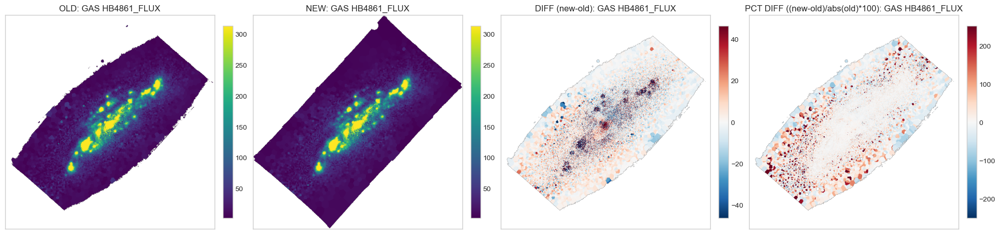

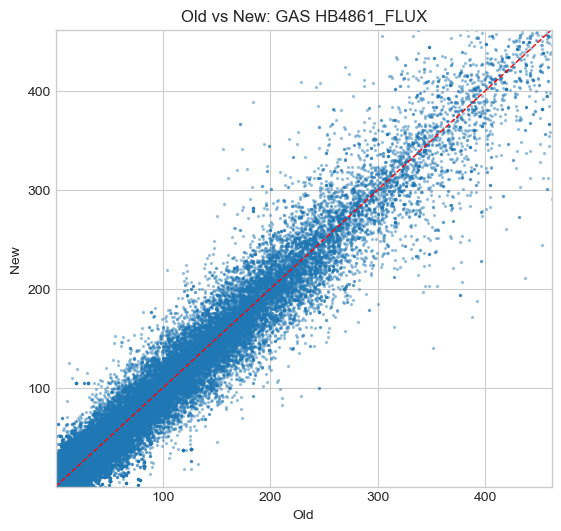


### OIII5006_FLUX


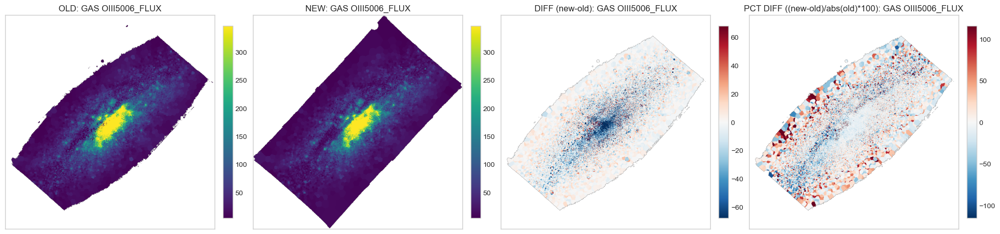

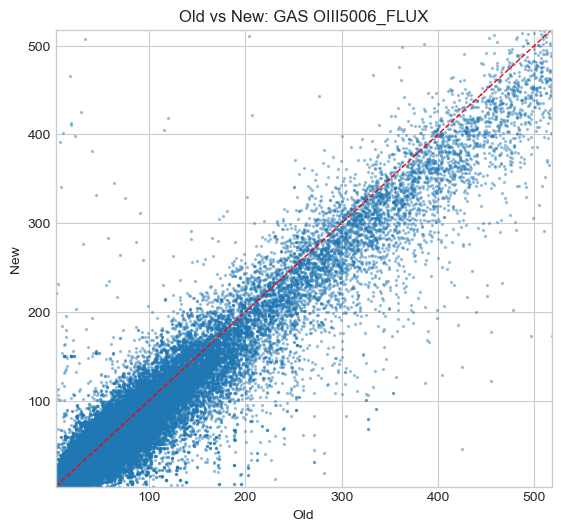


### NII6548_FLUX


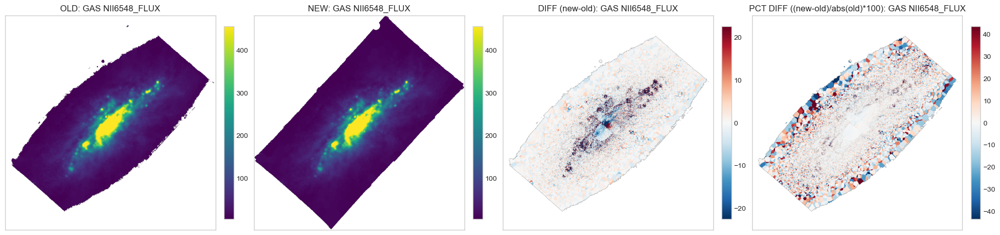

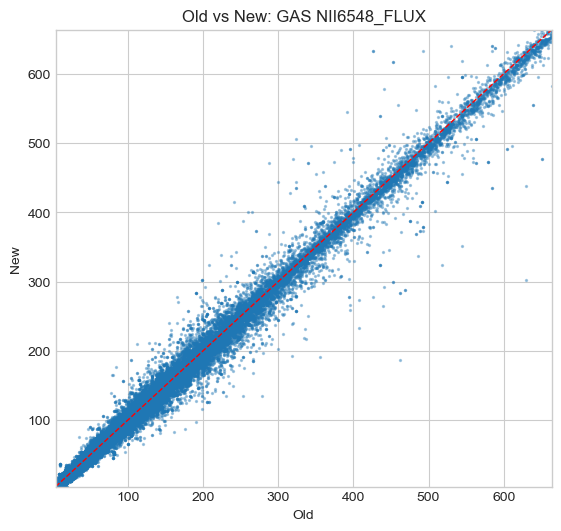


### HA6562_FLUX


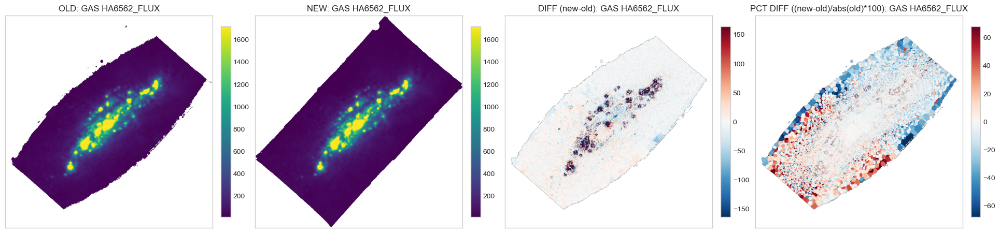

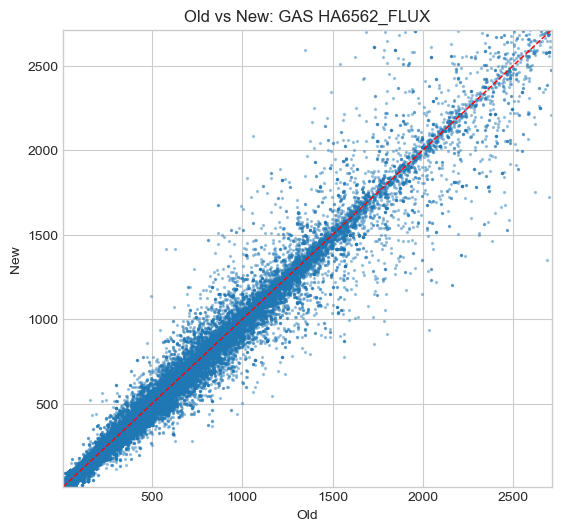


### SII6716_FLUX


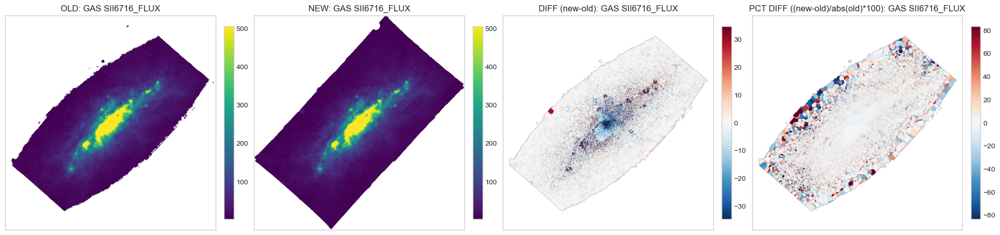

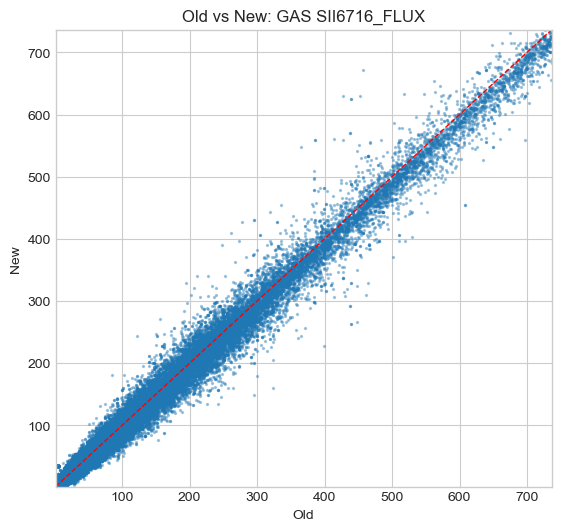


### SII6730_FLUX


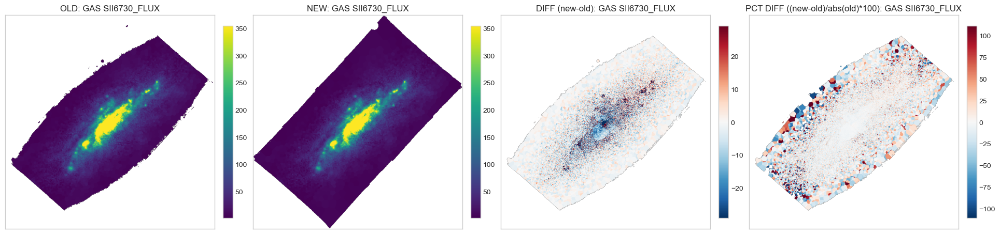

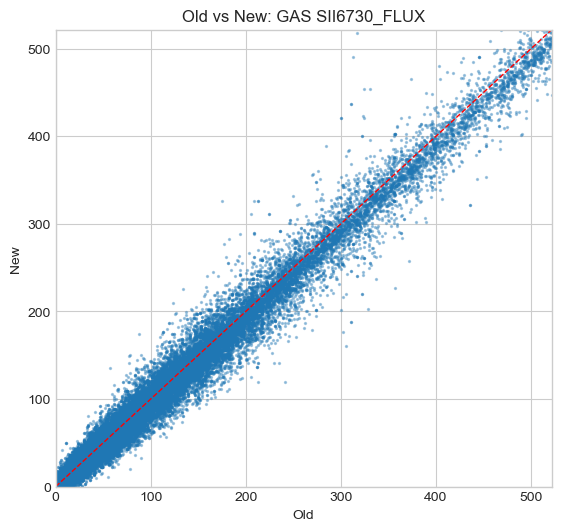

,quantity,n_valid,n_valid_nonzero_old,median_old,median_new,median_delta_new_minus_old,mean_delta_new_minus_old,std_delta,rms_delta,median_pct_change,mean_pct_change,std_pct_change,rms_pct_change,pearson_r
0,GAS_HB4861_FLUX,154244,152430,17.426054,18.315739,0.062126,0.226139,19.491275,19.492587,0.022907,28.773130,399.458437,400.493366,0.993316
1,GAS_OIII5006_FLUX,154244,153431,28.190216,26.317907,-1.272715,-4.681647,28.346283,28.730290,-4.811848,3.865224,213.652280,213.687240,0.992914
2,GAS_NII6548_FLUX,154244,154244,23.893702,23.827839,-0.294714,-0.581450,14.812745,14.824152,-0.829334,0.098429,17.440226,17.440503,0.999330
3,GAS_HA6562_FLUX,154244,154244,54.740142,52.852871,-2.363825,-3.775953,91.574004,91.651819,-3.103398,-2.599330,24.684665,24.821144,0.997799
4,GAS_SII6716_FLUX,154244,154244,24.360734,23.570758,-0.747275,-1.759184,14.987180,15.090073,-2.565682,0.831130,45.372351,45.379962,0.999177
5,GAS_SII6730_FLUX,154244,152216,16.281207,15.666543,-0.667919,-1.500999,13.533174,13.616159,-3.942148,13.603120,332.467488,332.745661,0.999162


In [7]:
gas_stats = []
for q, (old_m, new_m) in maps['gas'].items():
    print(f'\n### {q}')
    plot_triplet(old_m, new_m, f'GAS {q}')
    scatter_old_new(old_m, new_m, f'GAS {q}')
    gas_stats.append(compare_stats(old_m, new_m, f'GAS_{q}'))

gas_stats_df = pd.DataFrame(gas_stats)
display(gas_stats_df)

## Combined Summary Table

In [8]:
spatial_stats = [
    compare_stats(*maps['spatial']['SNRBIN'], 'SPATIAL_SNRBIN'),
    compare_stats(*maps['spatial']['FLUX'], 'SPATIAL_FLUX'),
]

kin_summary_stats = [
    compare_stats(old_m, new_m, f'KIN_{q}')
    for q, (old_m, new_m) in maps['kin'].items()
]

sfh_summary_stats = [
    compare_stats(old_m, new_m, f'SFH_{q}')
    for q, (old_m, new_m) in maps['sfh'].items()
]

gas_summary_stats = [
    compare_stats(old_m, new_m, f'GAS_{q}')
    for q, (old_m, new_m) in maps['gas'].items()
]

summary = pd.DataFrame(
    spatial_stats + kin_summary_stats + sfh_summary_stats + gas_summary_stats
)

summary = summary[
    [
        'quantity',
        'n_valid',
        'n_valid_nonzero_old',
        'median_old',
        'median_new',
        'median_delta_new_minus_old',
        'mean_delta_new_minus_old',
        'std_delta',
        'rms_delta',
        'median_pct_change',
        'mean_pct_change',
        'std_pct_change',
        'rms_pct_change',
        'pearson_r',
    ]
]

display(summary)

# Optional: save summary to disk for later report use
# summary.to_csv('NGC4419_v3_vs_v3tk_summary_stats.csv', index=False)
# print('Saved: NGC4419_v3_vs_v3tk_summary_stats.csv')

,quantity,n_valid,n_valid_nonzero_old,median_old,median_new,median_delta_new_minus_old,mean_delta_new_minus_old,std_delta,rms_delta,median_pct_change,mean_pct_change,std_pct_change,rms_pct_change,pearson_r
0,SPATIAL_SNRBIN,154244,154244,41.392921,41.282550,-0.143844,-0.191897,3.113041,3.118950,-0.346784,-0.164250,7.531421,7.533212,0.753485
1,SPATIAL_FLUX,154244,154244,39.537642,37.735909,-1.116746,0.186200,14.222737,14.223956,-4.247932,-3.253044,4.585043,5.621825,0.997274
2,KIN_V,154244,154243,75.192382,72.768711,-1.086678,-0.961420,6.250357,6.323867,-1.118921,-24.550989,2033.479999,2033.628201,0.997993
3,KIN_SIGMA,154244,154244,56.980355,54.985583,-1.917980,-2.091276,8.002747,8.271481,-3.396997,-2.132491,28.494586,28.574270,0.751359
4,KIN_H3,154244,154243,-0.003689,-0.007966,-0.003029,-0.005367,0.066107,0.066325,-12.279875,-99.056707,48975.147670,48975.247846,0.548957
5,KIN_H4,154244,154243,0.000584,0.007379,0.007138,0.002639,0.055806,0.055868,52.934739,-203.738746,40210.471419,40210.987568,0.331688
6,SFH_AGE,154244,154244,7.573432,7.751593,0.023413,0.140033,2.376938,2.381059,0.345298,7.167697,38.306690,38.971507,0.441637
7,SFH_METAL,154244,154244,-0.305436,-0.309885,-0.003786,-0.001092,0.141634,0.141638,-1.383930,-97.200866,2506.953756,2508.837409,0.776335
8,SFH_EBV,154244,153027,0.094343,0.074979,-0.016371,-0.012764,0.038644,0.040697,-15.066701,34.643004,647.229359,648.155831,0.896647
9,GAS_HB4861_FLUX,154244,152430,17.426054,18.315739,0.062126,0.226139,19.491275,19.492587,0.022907,28.773130,399.458437,400.493366,0.993316


## Automatic Conclusion Method

This final cell gives a compact, automatic judgement for the science-map comparisons only. Diagnostic binning-map quantities are not included in this final table.

`SFH_EBV` is still marked as expected different because different ngist versions can treat extinction differently.

For all remaining science maps, the decision uses two metrics:

1. `pearson_r`: the Pearson correlation between old and new finite pixels. This tests whether the two maps follow the same spatial pattern and lie close to a monotonic old/new trend. If `pearson_r < 0.9`, the map is classified as `changes a lot`.
2. `median_abs_pct_change`: the median absolute percentage change, computed from `100 * (new - old) / abs(old)` over pixels where the old value is non-zero. Using `abs(old)` keeps the sign of PCT DIFF consistent with the sign of DIFF for quantities that can be negative, such as `V` and `METAL`. This tests the typical amplitude difference after the correlation has already passed.

The conclusion rule is:

- If `pearson_r < 0.9`, classify as `changes a lot`.
- If `pearson_r >= 0.9` and `median_abs_pct_change <= 10`, classify as `similar`.
- If `pearson_r >= 0.9` and `median_abs_pct_change > 10`, classify as `somewhat similar`.

A note on percentage changes: for quantities that can be close to zero, such as `H3`, `H4`, or metallicity, percentage changes can look large even when absolute changes are small. This rule intentionally follows the simple criterion above so all included science maps are judged consistently.

The displayed `decision_metrics` column shows only the metric columns used to make each row's judgement.


In [9]:
# Domain-aware automatic conclusion for old/new ngist map comparisons.
# Run this after the map-loading and combined-summary cells above.

PEARSON_SIMILAR_LIMIT = 0.9
PCT_SIMILAR_LIMIT = 10.0

EXPECTED_DIFFERENT_REASONS = {
    'SFH_EBV': 'Expected different: due to ngist',
}


def robust_auto_stats(old_map, new_map, quantity):
    old_map, new_map = align_map_pair(old_map, new_map, quantity)
    mask = np.isfinite(old_map) & np.isfinite(new_map)
    if mask.sum() == 0:
        return {
            'quantity': quantity,
            'n_valid': 0,
            'median_abs_pct_change': np.nan,
            'pearson_r': np.nan,
        }

    old = old_map[mask]
    new = new_map[mask]

    pct_mask = mask & (old_map != 0)
    if pct_mask.sum() > 0:
        pct = 100.0 * (new_map[pct_mask] - old_map[pct_mask]) / np.abs(old_map[pct_mask])
        median_abs_pct = float(np.nanmedian(np.abs(pct)))
    else:
        median_abs_pct = np.nan

    if old.size > 1 and np.nanstd(old) > 0 and np.nanstd(new) > 0:
        pearson_r = float(np.corrcoef(old, new)[0, 1])
    else:
        pearson_r = np.nan

    return {
        'quantity': quantity,
        'n_valid': int(mask.sum()),
        'median_abs_pct_change': median_abs_pct,
        'pearson_r': pearson_r,
    }


def auto_quantity_family(quantity):
    if quantity.startswith('KIN_'):
        name = quantity.replace('KIN_', '', 1)
        if name in ('V', 'SIGMA'):
            return 'kin_velocity'
        if name in ('H3', 'H4'):
            return 'kin_moment'
        return 'kin'
    if quantity.startswith('GAS_') and quantity.endswith('_FLUX'):
        return 'gas_flux'
    if quantity.startswith('SFH_'):
        name = quantity.replace('SFH_', '', 1)
        if name == 'AGE':
            return 'sfh_age'
        if name == 'METAL':
            return 'sfh_metal'
        return 'sfh'
    return 'other'


def classify_auto_row(row):
    quantity = row['quantity']
    if quantity in EXPECTED_DIFFERENT_REASONS or quantity.endswith('_EBV'):
        return 'expected different', EXPECTED_DIFFERENT_REASONS.get(
            quantity,
            'Expected different: extinction treatment can vary between ngist versions.',
        ), []
    if row['n_valid'] == 0:
        return 'no valid overlap', 'No pixels are finite in both runs.', ['n_valid']

    pearson_r = row['pearson_r']
    median_abs_pct = row['median_abs_pct_change']
    if not np.isfinite(pearson_r) or pearson_r < PEARSON_SIMILAR_LIMIT:
        return 'changes a lot', f'pearson_r < {PEARSON_SIMILAR_LIMIT}', ['pearson_r', 'median_abs_pct_change']
    if np.isfinite(median_abs_pct) and median_abs_pct <= PCT_SIMILAR_LIMIT:
        return 'similar', f'pearson_r >= {PEARSON_SIMILAR_LIMIT} and median_abs_pct_change <= {PCT_SIMILAR_LIMIT}', ['pearson_r', 'median_abs_pct_change']
    return 'somewhat similar', f'pearson_r >= {PEARSON_SIMILAR_LIMIT} but median_abs_pct_change > {PCT_SIMILAR_LIMIT}', ['pearson_r', 'median_abs_pct_change']


def format_metric_value(value):
    if not np.isfinite(value):
        return 'nan'
    if value == 0:
        return '0'
    if abs(value) >= 1000 or abs(value) < 0.001:
        return f'{value:.3e}'
    return f'{value:.3g}'


def format_decision_metrics(row):
    columns = row['decision_columns']
    if len(columns) == 0:
        return row['note']
    return '; '.join(f'{column}={format_metric_value(row[column])}' for column in columns)


auto_rows = []
for group_name, group_maps in maps.items():
    if group_name == 'spatial':
        continue
    for map_name, (old_map, new_map) in group_maps.items():
        quantity = f'{group_name.upper()}_{map_name}'
        row = robust_auto_stats(old_map, new_map, quantity)
        row['family'] = auto_quantity_family(quantity)
        auto_rows.append(row)

auto_conclusion_full = pd.DataFrame(auto_rows)
classified = auto_conclusion_full.apply(classify_auto_row, axis=1, result_type='expand')
auto_conclusion_full['auto_conclusion'] = classified[0]
auto_conclusion_full['note'] = classified[1]
auto_conclusion_full['decision_columns'] = classified[2]
auto_conclusion_full['decision_metrics'] = auto_conclusion_full.apply(format_decision_metrics, axis=1)

judged = auto_conclusion_full[auto_conclusion_full['auto_conclusion'].isin(['similar', 'somewhat similar', 'changes a lot'])]
not_judged = auto_conclusion_full[auto_conclusion_full['auto_conclusion'].isin(['expected different'])]

similar = judged.loc[judged['auto_conclusion'] == 'similar', 'quantity'].tolist()
somewhat = judged.loc[judged['auto_conclusion'] == 'somewhat similar', 'quantity'].tolist()
large = judged.loc[judged['auto_conclusion'] == 'changes a lot', 'quantity'].tolist()

print('Automatic conclusion')
print('Not judged:', not_judged['quantity'].tolist())
print('Similar:', similar if similar else 'None')
print('Somewhat similar:', somewhat if somewhat else 'None')
print('Changes a lot:', large if large else 'None')

auto_conclusion = auto_conclusion_full[
    ['quantity', 'family', 'auto_conclusion', 'decision_metrics']
]

display(auto_conclusion)


Automatic conclusion
Not judged: ['SFH_EBV']
Similar: ['KIN_V', 'GAS_NII6548_FLUX']
Somewhat similar: ['GAS_HB4861_FLUX', 'GAS_OIII5006_FLUX', 'GAS_HA6562_FLUX', 'GAS_SII6716_FLUX', 'GAS_SII6730_FLUX']
Changes a lot: ['KIN_SIGMA', 'KIN_H3', 'KIN_H4', 'SFH_AGE', 'SFH_METAL']


,quantity,family,auto_conclusion,decision_metrics
0,KIN_V,kin_velocity,similar,pearson_r=0.998; median_abs_pct_change=4.59
1,KIN_SIGMA,kin_velocity,changes a lot,pearson_r=0.751; median_abs_pct_change=9.37
2,KIN_H3,kin_moment,changes a lot,pearson_r=0.549; median_abs_pct_change=212
3,KIN_H4,kin_moment,changes a lot,pearson_r=0.332; median_abs_pct_change=331
4,SFH_AGE,sfh_age,changes a lot,pearson_r=0.442; median_abs_pct_change=21.3
5,SFH_METAL,sfh_metal,changes a lot,pearson_r=0.776; median_abs_pct_change=30.6
6,SFH_EBV,sfh,expected different,Expected different: due to ngist
7,GAS_HB4861_FLUX,gas_flux,somewhat similar,pearson_r=0.993; median_abs_pct_change=22.7
8,GAS_OIII5006_FLUX,gas_flux,somewhat similar,pearson_r=0.993; median_abs_pct_change=18.5
9,GAS_NII6548_FLUX,gas_flux,similar,pearson_r=0.999; median_abs_pct_change=6.79
